# Clustering of 3D data (shapnet)

In [16]:
import pandas as pd

import sklearn.cluster as clustering
import hdbscan
from matplotlib import pyplot as plt
import sklearn

## Load the data 
- The data is the **latent vectors** of the 3D point cloud data generated by running the autoencoder (PointNet)
- This data is presently 100 Dimensional

In [2]:
latentVectors_df = pd.read_csv(r"C:\drive\project\clustering_project\dataset\results\experiment-3\tensors.tsv",
                            sep='\t', header=None)
latentVectors_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-6.876564,6.671771,0.608804,-0.717084,0.354729,-0.138605,-0.592223,-0.253065,-3.467004,-1.650005,...,1.164337,1.659127,0.456124,0.763990,-0.085341,0.077830,-0.712392,1.133955,-1.674720,0.626246
1,-3.390023,2.041003,0.708498,-2.346298,-0.225688,0.473727,0.385711,-0.626655,-3.664135,0.120693,...,-2.730813,2.449404,0.707037,1.609638,-0.998992,2.894641,-0.727557,0.279424,0.311295,0.161434
2,-6.802449,3.384143,0.068691,-3.631968,-0.086405,0.952787,0.673525,-0.606181,-5.063214,-0.077610,...,-2.511616,4.395524,0.770642,1.207505,0.003104,4.053833,-0.335613,0.145464,0.343581,0.209087
3,-0.198849,0.434826,-1.225485,0.504448,0.089131,0.178269,-0.902153,-0.300490,-0.322381,-1.710451,...,-0.475766,-0.161471,0.026169,-0.249238,0.410240,-0.379914,0.225598,-0.444264,-0.673578,-0.582737
4,-7.623657,8.566761,0.222779,-3.724938,-0.758873,-1.825372,0.006356,0.642843,-4.279436,-0.650960,...,1.872691,2.452985,1.967936,-0.345610,-0.670554,-0.595695,-0.634759,1.831921,-1.464758,-1.385642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15985,-3.664298,2.542011,-0.467891,1.026415,0.168122,-1.132988,-0.805708,-0.005011,1.236089,-0.280414,...,4.337984,-2.684787,-1.612878,0.975131,1.001925,-2.202808,-0.511806,-0.236609,-0.278670,1.159341
15986,0.134635,0.552373,-0.473613,0.603513,0.004439,-0.583661,-0.752547,-0.109812,1.145446,-0.041409,...,0.546556,-1.069281,0.336736,0.396817,-0.340004,-0.266267,-0.338560,0.133300,0.917704,0.317898
15987,-7.581455,4.247410,0.378157,-3.501695,0.124903,0.311479,0.366411,0.064287,-4.932477,1.171947,...,-2.868147,4.690732,1.051058,0.335703,-0.480029,4.276278,0.369397,0.342234,0.046615,0.533213
15988,0.569309,-0.421412,-0.622704,0.616182,0.133722,-0.534721,-0.726320,0.101053,0.921573,-0.498131,...,0.165621,-1.179950,0.339315,0.262561,0.057443,-0.100655,-0.064952,0.203919,0.770733,0.025974


In [4]:
filenames_df = pd.read_csv(r"C:\drive\project\clustering_project\dataset\results\experiment-3\metadata.tsv",
                                sep='\t')
filenames_df

,FileNames,Class
0,table_1325.pcd,table
1,car_1555.pcd,car
2,car_659.pcd,car
3,lamp_56.pcd,lamp
4,table_4030.pcd,table
...,...,...
15985,table_2263.pcd,table
15986,guitar_436.pcd,guitar
15987,car_754.pcd,car
15988,guitar_128.pcd,guitar


## Perfom Clustering without reducing dimensions

In [33]:
latentVectors_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-6.876564,6.671771,0.608804,-0.717084,0.354729,-0.138605,-0.592223,-0.253065,-3.467004,-1.650005,...,1.164337,1.659127,0.456124,0.763990,-0.085341,0.077830,-0.712392,1.133955,-1.674720,0.626246
1,-3.390023,2.041003,0.708498,-2.346298,-0.225688,0.473727,0.385711,-0.626655,-3.664135,0.120693,...,-2.730813,2.449404,0.707037,1.609638,-0.998992,2.894641,-0.727557,0.279424,0.311295,0.161434
2,-6.802449,3.384143,0.068691,-3.631968,-0.086405,0.952787,0.673525,-0.606181,-5.063214,-0.077610,...,-2.511616,4.395524,0.770642,1.207505,0.003104,4.053833,-0.335613,0.145464,0.343581,0.209087
3,-0.198849,0.434826,-1.225485,0.504448,0.089131,0.178269,-0.902153,-0.300490,-0.322381,-1.710451,...,-0.475766,-0.161471,0.026169,-0.249238,0.410240,-0.379914,0.225598,-0.444264,-0.673578,-0.582737
4,-7.623657,8.566761,0.222779,-3.724938,-0.758873,-1.825372,0.006356,0.642843,-4.279436,-0.650960,...,1.872691,2.452985,1.967936,-0.345610,-0.670554,-0.595695,-0.634759,1.831921,-1.464758,-1.385642


In [34]:
cluster_hdbscan = hdbscan.HDBSCAN(min_cluster_size=15)
cluster_hdbscan.min_samples
cluster_hdbscan.fit(latentVectors_df)

HDBSCAN(min_cluster_size=15)

In [35]:
# number of clusters 
cluster_hdbscan.labels_.max() 

38

In [36]:
cluster_hdbscan.labels_

array([-1, 10, 10, ..., -1,  7, -1], dtype=int64)

In [37]:
cluster_hdbscan.probabilities_

array([0.        , 0.73659715, 1.        , ..., 0.        , 1.        ,
       0.        ])

<AxesSubplot:ylabel='$\\lambda$ value'>

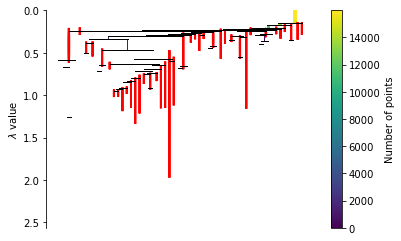

In [38]:
cluster_hdbscan.condensed_tree_.plot(select_clusters=True)

## Performing Clustering after reducing dimensions

### Reducing Dimensions using <font color='blue'>UMAP</font>


In [5]:
import umap
import plotly.express as px
import umap.plot 

### Reduce to 2-dimensions

In [6]:
reducer_2d = umap.UMAP(n_components=2)
print(reducer_2d)
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(latentVectors_df)

reduced_data = reducer_2d.fit_transform(scaled_data)
reduced_data.shape

UMAP(dens_frac=0.0, dens_lambda=0.0)


(15990, 2)

In [19]:
# plot using umap plotting
# umap.plot.points(reducer_2d, labels=filenames_df['Class'])

In [18]:
# plot using umap: interactive plot 
# umap.plot.output_notebook()
# p = umap.plot.interactive(reducer_2d, labels=filenames_df['Class'], hover_data=filenames_df, point_size=2)
# umap.plot.show(p)

In [17]:
# # plot using matplot lib
# plt.scatter(reduced_data[:, 0], reduced_data[:, 1])

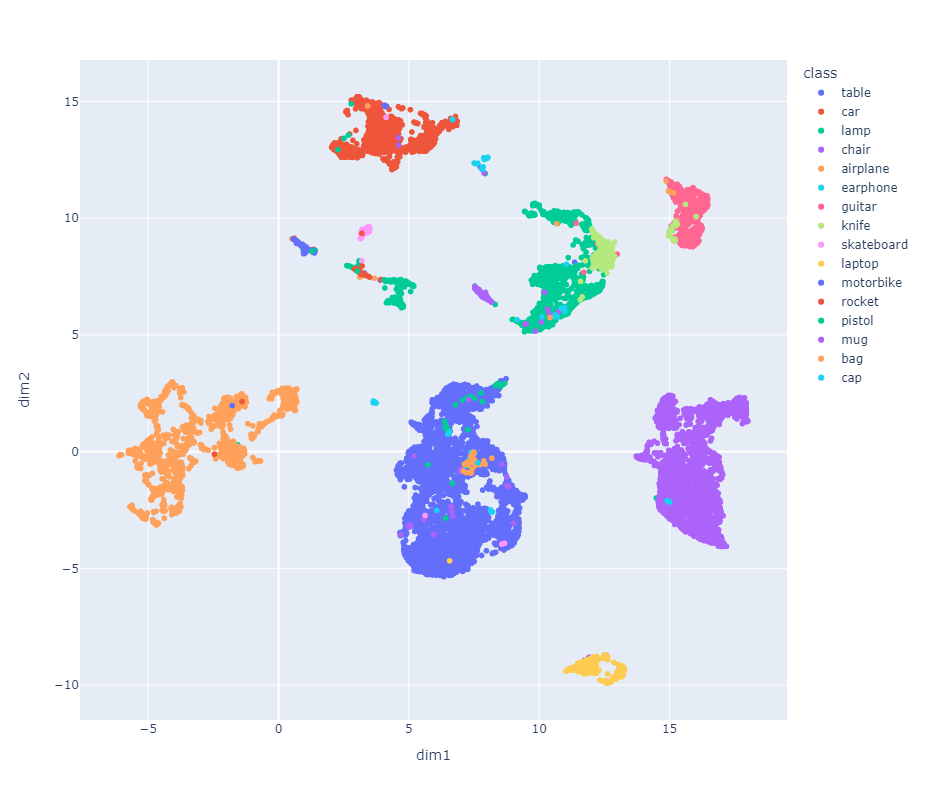

In [11]:
# plot using plotly 
reduced_data_df = pd.DataFrame(reduced_data, columns=['dim1', 'dim2'])
reduced_data_df['class'] = filenames_df['Class']

plotly_scatter = px.scatter(reduced_data_df, x='dim1', y='dim2', hover_data= ['class'], color='class')


plotly_scatter.update_layout(
    autosize=False,
    width=800,
    height=800,)

plotly_scatter.show()

In [12]:
# plotly_scatter = px.scatter_matrix(reduced_data_df, dimensions=['dim1', 'dim2'], hover_data= ['class'], color='class')
# plotly_scatter.update_layout(
#     autosize=False,
#     width=800,
#     height=800,)
# plotly_scatter.show()

### Clustering using HDBSCAN - 2D

In [21]:
import hdbscan
# hyperparameter of min_cluster
cluster_hdbscan = hdbscan.HDBSCAN(min_cluster_size=15)
cluster_hdbscan.min_samples

In [22]:
cluster_hdbscan.fit(reduced_data)

HDBSCAN(min_cluster_size=15)

In [23]:
# number of clusters 
cluster_hdbscan.labels_.max() 

73

In [24]:
cluster_hdbscan.labels_

array([ 6, 30, 32, ..., 29,  7, 73], dtype=int64)

In [48]:
nosie = list(cluster_hdbscan.labels_)
noise

TypeError: 'int' object is not iterable

In [25]:
# probability of each data point being in the particular cluster
cluster_hdbscan.probabilities_

array([1., 1., 1., ..., 1., 1., 1.])

<AxesSubplot:ylabel='$\\lambda$ value'>

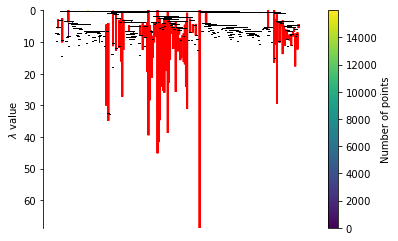

In [26]:
cluster_hdbscan.condensed_tree_.plot(select_clusters=True)

In [ ]:
# crashes the kernel 
# cluster_hdbscan.single_linkage_tree_.plot()

### Visualize the Clustering 

In [27]:
labels_df = pd.DataFrame(cluster_hdbscan.labels_, columns=["clusters"])

In [28]:
labels_df.value_counts()

clusters
 6          4866
 0          3332
-1          1018
 29          901
 7           736
            ... 
 37           21
 47           20
 17           19
 40           18
 52           18
Length: 75, dtype: int64

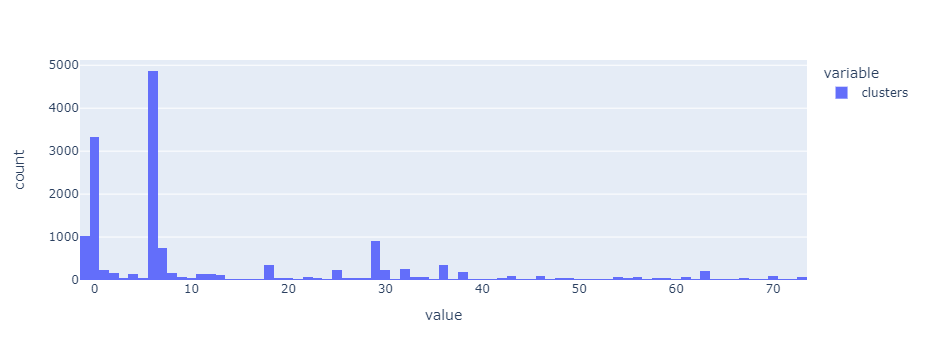

In [29]:
# distribution of cluster sizes
fig_cluster_dist = px.histogram(labels_df)
fig_cluster_dist

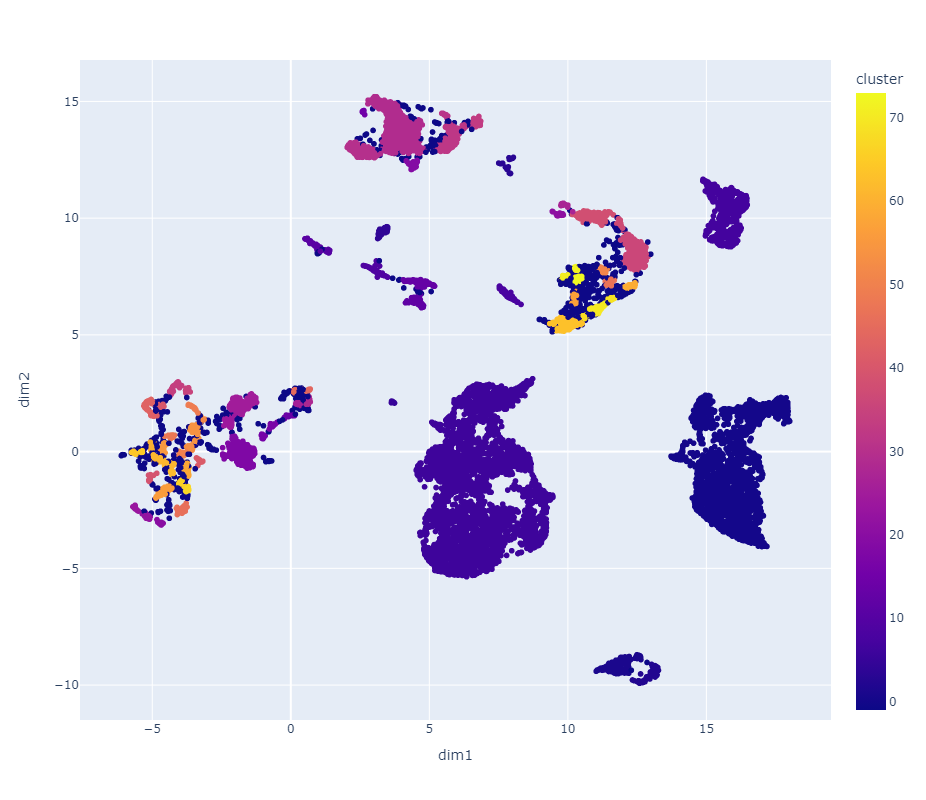

In [30]:
clustered_data_df = pd.DataFrame(reduced_data, columns=['dim1', 'dim2'])
clustered_data_df['cluster'] = cluster_hdbscan.labels_
clustered_data_df['ground_truth'] = filenames_df['Class']
plotly_scatter = px.scatter(clustered_data_df, x='dim1', y='dim2', hover_data= ['cluster', 'ground_truth'], color='cluster')


plotly_scatter.update_layout(
    autosize=False,
    width=800,
    height=800,)

plotly_scatter.show()

In [ ]:
# plot using baby plot
# bp_cluster = Babyplot()
# bp_cluster.add_plot(data.tolist(), "pointCloud", "categories", [str(x) for x in list(cluster_hdbscan.labels_)], 
#             {'showLegend' : True, 'colorScale': 'Paired'})
# bp_cluster

### Reduce to 3-dimensions

In [49]:
reducer_3d = umap.UMAP(n_components=3)
print(reducer_3d)
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(latentVectors_df)

reduced_data = reducer_3d.fit_transform(scaled_data)
reduced_data.shape

UMAP(dens_frac=0.0, dens_lambda=0.0, n_components=3)


(15990, 3)

In [51]:
# plot using umap - not supported for 3d data
#umap.plot.points(reducer_3d)

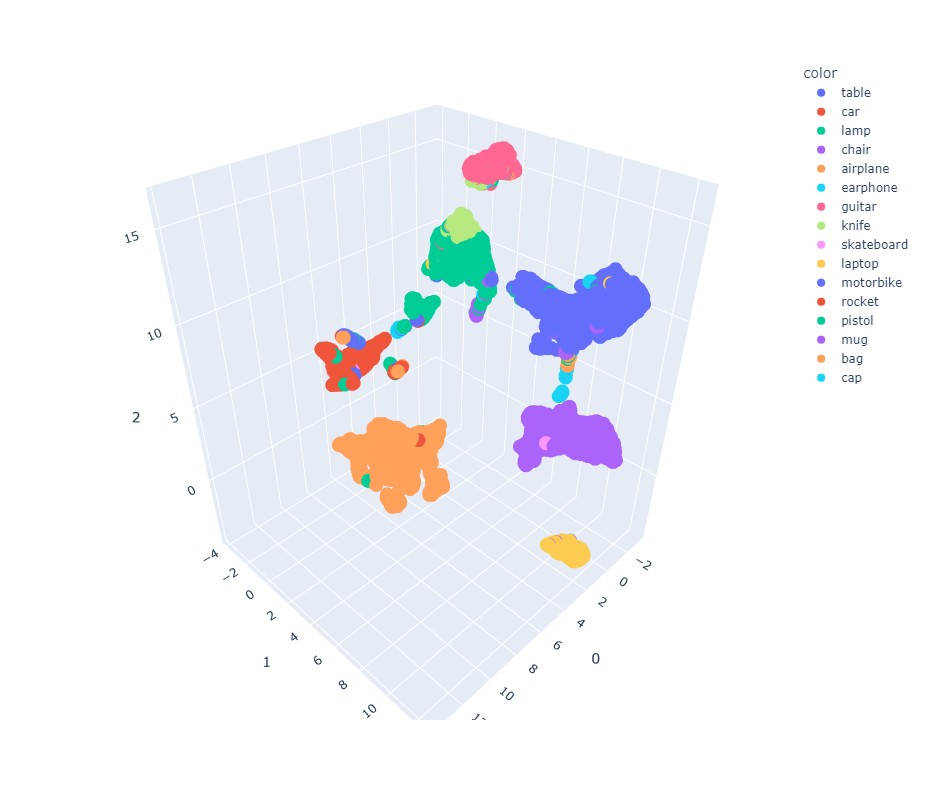

In [52]:
plotly_scatter_3d = px.scatter_3d(reduced_data, x=0, y=1, z=2, color=filenames_df['Class'])

plotly_scatter_3d.update_layout(
    autosize=False,
    width=800,
    height=800,)

plotly_scatter_3d.show()


In [69]:
# plot using baby plots
# from babyplots import Babyplot
# bp = Babyplot()

# # filenames_df["Class"].to_list()
# bp.add_plot(reduced_data.tolist(), "pointCloud", "categories", filenames_df["Class"].to_list(), 
#             {'showLegend' : True, 'colorScale': 'Paired'})
# bp

### Clustering using HDBSCAN - 3D

In [53]:
import hdbscan
# hyperparameter of min_cluster
cluster_hdbscan = hdbscan.HDBSCAN(min_cluster_size=15)
cluster_hdbscan.min_samples

In [54]:
cluster_hdbscan.fit(reduced_data)

HDBSCAN(min_cluster_size=15)

In [55]:
# number of clusters 
cluster_hdbscan.labels_.max() 

83

In [57]:
cluster_hdbscan.labels_

array([17, 38, 40, ..., -1,  6, 60], dtype=int64)

In [58]:
# probability of each data point being in the particular cluster
cluster_hdbscan.probabilities_

array([1., 1., 1., ..., 0., 1., 1.])

In [ ]:
cluster_hdbscan.condensed_tree_.plot(select_clusters=True)

In [ ]:
# crashes the kernel 
# cluster_hdbscan.single_linkage_tree_.plot()

### Visualize the Clustering 

In [59]:
labels_df = pd.DataFrame(cluster_hdbscan.labels_, columns=["clusters"])

In [60]:
labels_df.value_counts()

clusters
 17         4819
 0          3338
-1          1214
 6           740
 52          522
            ... 
 36           17
 30           17
 18           16
 75           15
 46           15
Length: 85, dtype: int64

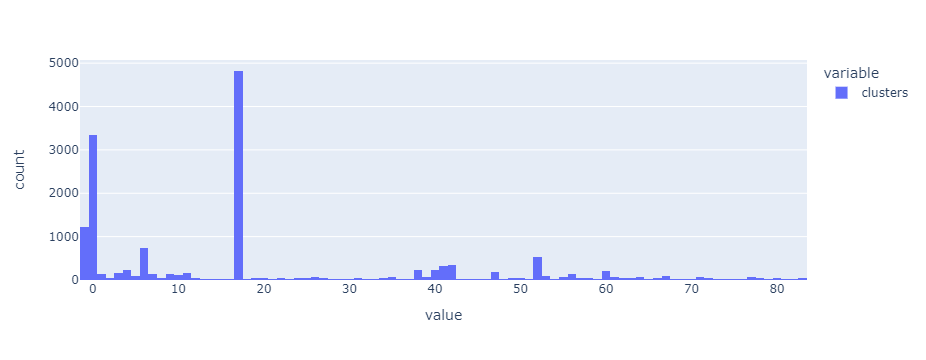

In [61]:
# distribution of cluster sizes
fig_cluster_dist = px.histogram(labels_df)
fig_cluster_dist

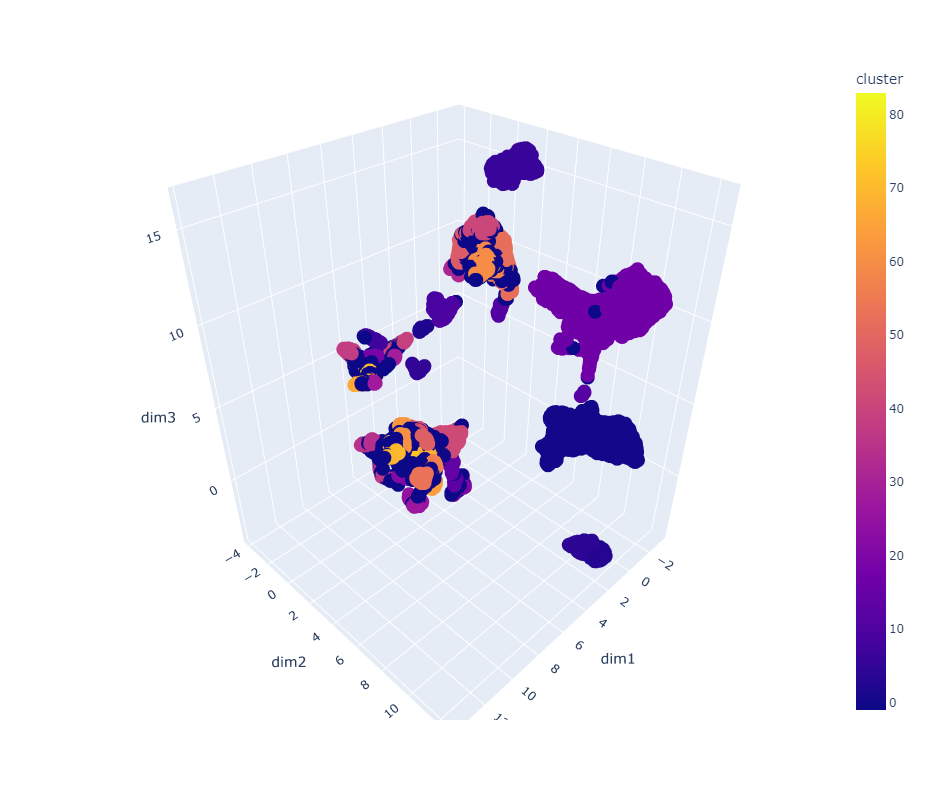

In [62]:
clustered_data_df = pd.DataFrame(reduced_data, columns=['dim1', 'dim2', 'dim3'])
clustered_data_df['cluster'] = cluster_hdbscan.labels_
clustered_data_df['ground_truth'] = filenames_df['Class']
plotly_scatter = px.scatter_3d(clustered_data_df, x='dim1', y='dim2', z='dim3', hover_data= ['cluster', 'ground_truth'], color='cluster')


plotly_scatter.update_layout(
    autosize=False,
    width=800,
    height=800,)

plotly_scatter.show()

## Dump the cluster for visualizatioin in Embedding projector - https://projector.tensorflow.org/ 

In [39]:
filenames_df["Clusters"] = cluster_hdbscan.labels_
filenames_df.head()

,FileNames,Class,Clusters
0,table_1325.pcd,table,-1
1,car_1555.pcd,car,10
2,car_659.pcd,car,10
3,lamp_56.pcd,lamp,7
4,table_4030.pcd,table,-1


In [40]:
filenames_df.set_index('FileNames')

,Class,Clusters
FileNames,,
table_1325.pcd,table,-1
car_1555.pcd,car,10
car_659.pcd,car,10
lamp_56.pcd,lamp,7
table_4030.pcd,table,-1
...,...,...
table_2263.pcd,table,-1
guitar_436.pcd,guitar,7
car_754.pcd,car,-1


In [43]:
filenames_df.to_csv("metadata_clustering.tsv", sep='\t', index=False)

In [67]:
filenames_df[filenames_df['Class'] == 'chair']['Clusters'].value_counts()

-1     1777
 13    1431
 4      161
 2        2
Name: Clusters, dtype: int64